# Procesamiento Digital de Imágenes Satelitales
# Instituto Gulich - Mayo - Julio 2025

---
#  Clase 06a: Imágenes Sentinel 2
---
Lo que veremos en esta notebook:

- [x] Imágenes Sentinel-2. Cartacterísticas.
- [x] Lectura por bandas. 
- [x] Minimum bounding box. Lecturas de recortes.
- [x] Lectura directa desde archivos comprimidos. 
---

### Objetivos de la notebook:

- En esta notebook esperamos que aprendas a leer recortes espaciales y espectrales de imágenes Sentinel-2 sin necesidad de descomprimirlas.

### Datos con los que trabajaremos en esta Notebook:

- Dos Sentinel-2 del dique Roggero en **data/raw_data/**:
    - **L1C_T21HUB_A017181_20181006T135109.zip**
    - **L1C_T21HUB_A023044_20191120T135113.zip**
- El archivo vectorial encuadrando la zona del Dique Roggero:
    - **data/raw_data/vector/zona_dique.geojson**

## 1. La misión Sentinel-2. 


### Bandas, resoluciones, frecuencia. Datos libres.
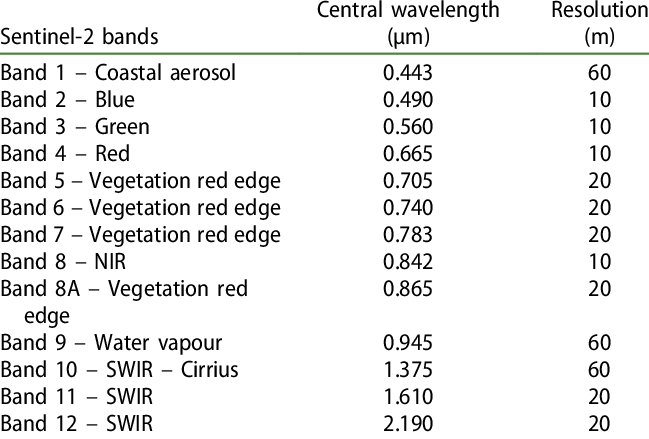

[Varias combinaciones de bandas para visualizacions diversas](https://gisgeography.com/sentinel-2-bands-combinations/)

## 2. T21HUB y Zona del Dique Roggero. 
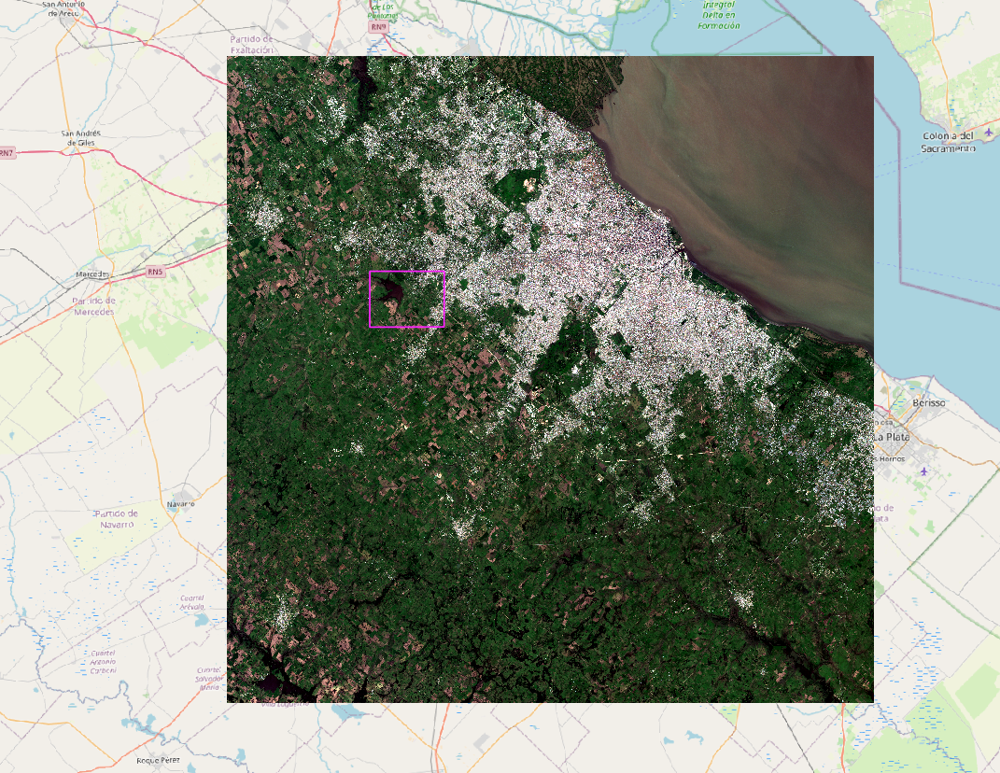

## 3. Lectura y escritura de recortes de Sentinel-2.

- La idea del mbb
- Lectura de (recorte o no) de bandas selccionadas
- Lectura directa del .zip


Las librerías que vamos a utilizar son:

```python
import os
import numpy as np
import matplotlib.pyplot as plt

import geopandas as gpd

import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import shape

import sys
sys.path.append('../')
from funciones import *
```

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import geopandas as gpd

import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import shape

import funciones as func

Compute Minimum Bounding Box 

```python
def compute_mbb(fn):
    """
    Dado archivo vectorial (shp, geojson, etc), calcula el
    mínimo rectángulo (Minimum bounding box MBB) que contenga 
    su primer geometría
    """

    gdf = gpd.read_file(fn)

    # Verificar que haya al menos una geometría en el archivo
    if gdf.empty:
        raise ValueError("El archivo no contiene geometrías válidas.")
    
    first_geom = gdf.iloc[0]['geometry']  # miro solo la primer geometría del archivo
    return first_geom.envelope
```

In [2]:
def compute_mbb(fn):
    """
    Dado archivo vectorial (shp, geojson, etc), calcula el
    mínimo rectángulo (Minimum bounding box MBB) que contenga 
    su primer geometría
    """

    gdf = gpd.read_file(fn)

    # Verificar que haya al menos una geometría en el archivo
    if gdf.empty:
        raise ValueError("El archivo no contiene geometrías válidas.")
    
    first_geom = gdf.iloc[0]['geometry']  # miro solo la primer geometría del archivo
    return first_geom.envelope

En el caso de Sentinel, si abrimos nuestras imágenes veremos que las esquinas de los pixeles coinciden con un valor de coordenadas que corresponde a un múltiplo de la resolución de la banda (10, 20 o 60 según sea el caso). Si quiero ajustar mi _mbb_ a esa grilla debemos modificar un poco la función anterior. Una propuesta es la siguiente:

```python
def compute_mbb(fn, snap_to_grid=True, grid_step=10):
    """
    Dado archivo vectorial (shp, geojson, etc), calcula el
    mínimo rectángulo (Minimum bounding box MBB) que contenga 
    su primer geometría, usando vértices en una grilla de paso dado
    
    Params:
        fn: Ruta al archivo vectorial (Shapefile, GeoJSON, etc.)
        snap_to_grid: Si True, ajusta las coordenadas a una grilla
        grid_step: Paso de la grilla para el ajuste
    
    return:
        Objeto Polygon con el rectángulo mínimo que contiene la primer
        geometría
    
    """

    # Cargar el archivo
    gdf = gpd.read_file(fn)
    
    # Verificar que haya al menos una geometría en el archivo
    if gdf.empty:
        raise ValueError("El archivo no contiene geometrías válidas.")
    
    first_geom = gdf.geometry.iloc[0] # Seleccionar la primera geometría válida    
    
    mX, mY, MX, MY = first_geom.bounds
    
    if snap_to_grid:
        mX = grid_step * np.floor(mX / grid_step)
        MX = grid_step * np.ceil(MX / grid_step)
        mY = grid_step * np.floor(mY / grid_step)
        MY = grid_step * np.ceil(MY / grid_step)

    mbb = shape({
                 'type': 'Polygon',
                 'coordinates': [[(mX, MY),
                                  (MX, MY),
                                  (MX, mY),
                                  (mX, mY),
                                  (mX, MY)]]
                })
    return mbb
```

Para profundizar en excepciones, se puede consultar el siguiente [enlace](https://realpython.com/python-raise-exception/#raising-built-in-exceptions)

In [3]:
def compute_mbb(fn, snap_to_grid=True, grid_step=10):
    
    """
    Dado archivo vectorial (shp, geojson, etc), calcula el
    mínimo rectángulo (Minimum bounding box MBB) que contenga 
    su primer geometría, usando vértices en una grilla de paso dado
    
    Params:
        fn: Ruta al archivo vectorial (Shapefile, GeoJSON, etc.)
        snap_to_grid: Si True, ajusta las coordenadas a una grilla
        grid_step: Paso de la grilla para el ajuste
    
    return:
        Objeto Polygon con el rectángulo mínimo que contiene la primer
        geometría
    
    """

    # Cargar el archivo
    gdf = gpd.read_file(fn)
    
    # Verificar que haya al menos una geometría en el archivo
    if gdf.empty:
        raise ValueError("El archivo no contiene geometrías válidas.")
    
    first_geom = gdf.geometry.iloc[0] # Seleccionar la primera geometría válida    
    
    mX, mY, MX, MY = first_geom.bounds
    
    if snap_to_grid:
        mX = grid_step * np.floor(mX / grid_step)
        MX = grid_step * np.ceil(MX / grid_step)
        mY = grid_step * np.floor(mY / grid_step)
        MY = grid_step * np.ceil(MY / grid_step)

    mbb = shape({
                 'type': 'Polygon',
                 'coordinates': [[(mX, MY),
                                  (MX, MY),
                                  (MX, mY),
                                  (mX, mY),
                                  (mX, MY)]]
                })
    return mbb

Carguemos el vector "zona_dique.geojson" para ver el resultado de ejecutar nuestra función:

```python
path_vector = '../data/raw_data/vector/'
mbb_dique = compute_mbb(os.path.join(path_vector, 'zona_dique.geojson'), grid_step=100)

mbb_dique
```

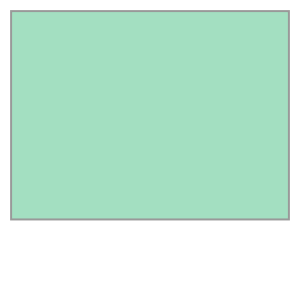

In [4]:
path_vector = './raw_data/vector/'

mbb_dique = compute_mbb(os.path.join(path_vector, 'zona_dique.geojson'), grid_step=100)

mbb_dique

## Vamos a usar diferente informacion y a tratar de guardarla ordenada

Vamos a empezar leyendo recortes (con _mbb_) de las bandas de 10m de resolución de una imagen Sentinel-2 L1C. Vamos a descomprimir el archivo **L1C_T21HUB_A017181_20181006T135109.zip** en su misma carpeta. Para información adicional sobre estos datos se puede consultar el siguiente [enlace](https://docs.sentinel-hub.com/api/latest/data/sentinel-2-l1c/).

Los pasos intermedios del procesamiento los vamos a guardar en un directorio _data/proc/_ y los de salida en _data/out/_

```python
path_in_img1 = '../data/raw_data/L1C_T21HUB_A017181_20181006T135109/S2A_MSIL1C_20181006T135111_N0206_R024_T21HUB_20181006T155043.SAFE/GRANULE/L1C_T21HUB_A017181_20181006T135109/IMG_DATA/'
path_proc = '../data/proc/'
path_out = '../data/out/'
```

In [5]:
path_in_img1 = './raw_data/L1C_T21HUB_A023044_20191120T135113/S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/'
path_proc = './proc/'
path_out = './out/'

Carguemos un recorte de las bandas B02, B03, B04 y B08 haciendo uso del _mbb_ calculado anteriormente y a apliquiemos el factor de escala que para estos datos es 10000:

```python
# Leyendo B02
fn = 'T21HUB_20181006T135111_B02.jp2'

with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)
    crs = src.crs

# Aplicamos el factor de escala:
B_blue = np.float32(banda[0]) / 10000.

# Leyendo B03
fn = 'T21HUB_20181006T135111_B03.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_green = np.float32(banda[0]) / 10000.

# Leyendo B04
fn = 'T21HUB_20181006T135111_B04.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_red = np.float32(banda[0]) / 10000.

# Leyendo B08
fn = 'T21HUB_20181006T135111_B08.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_nir = np.float32(banda[0]) / 10000.

```

In [6]:
# Leyendo B02
fn = 'T21HUB_20191120T135111_B02.jp2'

with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)
    crs = src.crs

# Aplicamos el factor de escala:
B_blue = np.float32(banda[0]) / 10000.

# Leyendo B03
fn = 'T21HUB_20191120T135111_B03.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_green = np.float32(banda[0]) / 10000.

# Leyendo B04
fn = 'T21HUB_20191120T135111_B04.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_red = np.float32(banda[0]) / 10000.

# Leyendo B08
fn = 'T21HUB_20191120T135111_B08.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_nir = np.float32(banda[0]) / 10000.

Visualicemos nuestra imagen en RGB:

```python
fig, ax = plt.subplots(figsize=(10, 10))

show(nequalize(np.stack([B_red, B_green, B_blue])),
     transform=out_transform, ax=ax)

ax.set_title('Combinación Color Verdadero')
ax.ticklabel_format(style='plain')

plt.show()
```

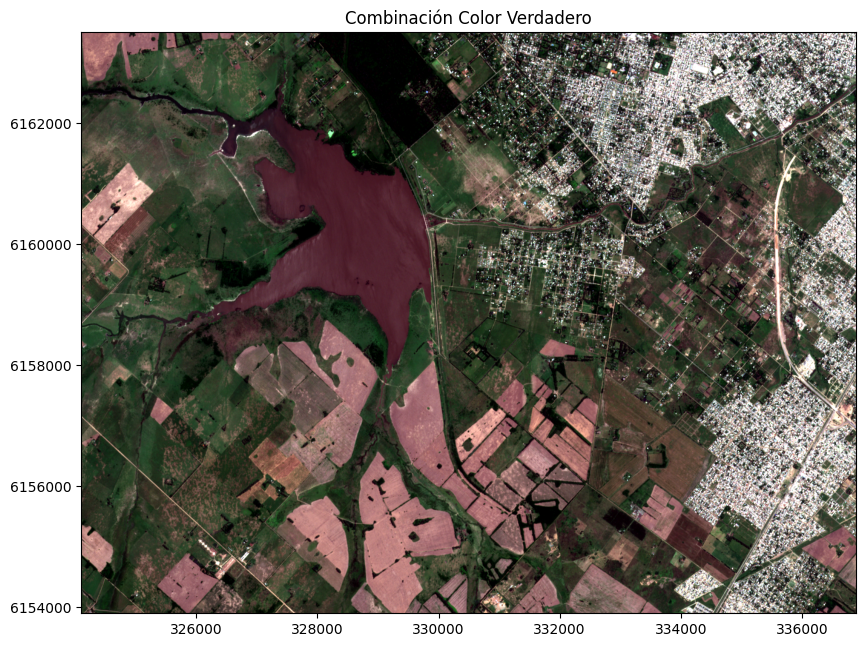

In [7]:
fig, ax = plt.subplots(figsize=(10, 10))

show(func.nequalize(np.stack([B_red, B_green, B_blue])),
     transform=out_transform, ax=ax)

ax.set_title('Combinación Color Verdadero')
ax.ticklabel_format(style='plain')

plt.show()

Vamos a calcular el NDVI:

```python
# Calculamos el NDVI
B_ndvi = (B_nir - B_red) / (B_nir + B_red)
```

In [8]:
B_ndvi = (B_nir - B_red) / (B_nir + B_red)

Vamos a utilizar nuestra función "guardar_GTiff" para guardar un _stack_ con nuestras bandas:

```python
# Definimos los parámetros de salida:
bandnames_B_G_R_NIR_NDVI =['Blue', 'Green', 'Red', 'NIR', 'NDVI']
output_name = path_out + 'Dique_B_G_R_NIR_NDVI.tif'
stack = np.stack([B_blue, B_green, B_red, B_nir, B_ndvi])

# Ejecutamos la función:
guardar_GTiff(output_name,
              crs,
              out_transform,
              stack,
              bandnames=bandnames_B_G_R_NIR_NDVI)
```

In [9]:
# Definimos los parámetros de salida:
bandnames_B_G_R_NIR_NDVI =['Blue', 'Green', 'Red', 'NIR', 'NDVI']
output_name = path_out + 'Dique_B_G_R_NIR_NDVI.tif'
stack = np.stack([B_blue, B_green, B_red, B_nir, B_ndvi])

# Ejecutamos la función:
func.guardar_GTiff_vF(output_name,
              crs,
              out_transform,
              stack,
              bandnames=bandnames_B_G_R_NIR_NDVI)

Si queremos poner lo anterior en una función, una alternativa sería:

```python
def extract_10m_bands_Sentinel2(img_data_dir, mbb=None, compute_ndvi=True, verbose=True):
    """
    Dado un directorio con las bandas de una imagen Sentinel 2, extrae las 4 bandas de 10m 
    de resolución (2, 3, 4 y 8) y calcula el NDVI. Si se pasa un polígono mbb en formato 
    GeoJSON, recorta la imagen según dicho polígono, de lo contrario extrae la imagen completa.
    
    Parámetros:
        img_data_dir: Ruta al directorio que contiene las bandas de la imagen Sentinel 2.
        mbb: Polígono en formato GeoJSON para recortar la imagen (opcional).
        compute_ndvi: Booleano para calcular el NDVI (opcional, por defecto True).
        verbose: Booleano para imprimir información adicional (opcional, por defecto True).
    
    Devuelve:
        np.ndarray: Matriz con las bandas extraídas (incluyendo NDVI si se calcula).
        crs: Sistema de referencia de coordenadas de la imagen.
        out_transform: Transformación geoespacial de la imagen.
    """
    
    band_names = ['B02.', 'B03.', 'B04.', 'B08.']
    
    ls = os.listdir(img_data_dir)
    bands = []

    crs = None
    out_transform = None
    idx = {}
    
    for pos, b in enumerate(band_names):
        fn = [fn for fn in ls if b in fn]

        # Nos aseguramos que el archivo exista, de lo contrario generamos un error
        # de tipo FileNotFoundError
        if not fn:
            raise FileNotFoundError(f"Banda {b} no encontrada en {img_data_dir}.")
        
        idx[b.rstrip('.')] = pos 
        if verbose: print(f"Leyendo {fn}.")

        fn = os.path.join(img_data_dir, fn[0])

        with rasterio.open(fn) as src:
            subband_crs = src.crs  # recuerdo el sistema de referencia para poder grabar

            if mbb:  # si hay mbb hago un clip
                array, subband_transform = mask(src, [mbb], crop=True)
            else:  # si no, uso la imagen entera
                array = src.read()
                subband_transform = src.transform

        # Asegurarse de que crs y transform estén definidos (deben ser los mismos para todas las bandas)
        # En caso que estemos leyendo bandas con diferente resolución o crs, esto deberá generar un error
        # de tipo Value Error
        
        if crs is None:
            crs, out_transform = subband_crs, subband_transform
        elif crs != subband_crs or not np.array_equal(out_transform, subband_transform):
            raise ValueError(f"La banda {b} tiene diferente CRS o transformaciones.")
        
        # Normalizar la banda
        bands.append(np.float32(array[0]) / 10000)

    if compute_ndvi:
        if verbose: print(f"Calculando NDVI.")
        
        ndvi = (bands[idx['B08']] - bands[idx['B04']]) / (bands[idx['B08']] + bands[idx['B04']])
        bands.append(ndvi)

    return np.stack(bands), crs, out_transform
```

In [13]:
def extract_10m_bands_Sentinel2(img_data_dir, mbb=None, compute_ndvi=True, verbose=True):
    """
    Dado un directorio con las bandas de una imagen Sentinel 2, extrae las 4 bandas de 10m 
    de resolución (2, 3, 4 y 8) y calcula el NDVI. Si se pasa un polígono mbb en formato 
    GeoJSON, recorta la imagen según dicho polígono, de lo contrario extrae la imagen completa.
    
    Parámetros:
        img_data_dir: Ruta al directorio que contiene las bandas de la imagen Sentinel 2.
        mbb: Polígono en formato GeoJSON para recortar la imagen (opcional).
        compute_ndvi: Booleano para calcular el NDVI (opcional, por defecto True).
        verbose: Booleano para imprimir información adicional (opcional, por defecto True).
    
    Devuelve:
        np.ndarray: Matriz con las bandas extraídas (incluyendo NDVI si se calcula).
        crs: Sistema de referencia de coordenadas de la imagen.
        out_transform: Transformación geoespacial de la imagen.
    """
    
    band_names = ['B02.', 'B03.', 'B04.', 'B08.']
    
    ls = os.listdir(img_data_dir)
    bands = []

    crs = None
    out_transform = None
    idx = {}
    
    for pos, b in enumerate(band_names):
        fn = [fn for fn in ls if b in fn]

        # Nos aseguramos que el archivo exista, de lo contrario generamos un error
        # de tipo FileNotFoundError
        if not fn:
            raise FileNotFoundError(f"Banda {b} no encontrada en {img_data_dir}.")
        
        idx[b.rstrip('.')] = pos 
        if verbose: print(f"Leyendo {fn}.")

        fn = os.path.join(img_data_dir, fn[0])

        with rasterio.open(fn) as src:
            subband_crs = src.crs  # recuerdo el sistema de referencia para poder grabar

            if mbb:  # si hay mbb hago un clip
                array, subband_transform = mask(src, [mbb], crop=True)
            else:  # si no, uso la imagen entera
                array = src.read()
                subband_transform = src.transform

        # Asegurarse de que crs y transform estén definidos (deben ser los mismos para todas las bandas)
        # En caso que estemos leyendo bandas con diferente resolución o crs, esto deberá generar un error
        # de tipo Value Error
        
        if crs is None:
            crs, out_transform = subband_crs, subband_transform
        elif crs != subband_crs or not np.array_equal(out_transform, subband_transform):
            raise ValueError(f"La banda {b} tiene diferente CRS o transformaciones.")
        
        # Normalizar la banda
        bands.append(np.float32(array[0]) / 10000)

    if compute_ndvi:
        if verbose: print(f"Calculando NDVI.")
        
        ndvi = (bands[idx['B08']] - bands[idx['B04']]) / (bands[idx['B08']] + bands[idx['B04']])
        bands.append(ndvi)

    return np.stack(bands), crs, out_transform

Nuestra función retorna tres parámetros, por lo que una alternativa es capturar cada salida en una variable independiente:

```python
S2_dique_20181006, crs, gt = extract_10m_bands_Sentinel2(path_in_img1,
                                                         mbb=mbb_dique)

S2_dique_20181006.shape
```

In [15]:
S2_dique_20181006, crs, gt = extract_10m_bands_Sentinel2(path_in_img1,
                                                         mbb=mbb_dique)

S2_dique_20181006.shape

Leyendo ['T21HUB_20191120T135111_B02.jp2'].
Leyendo ['T21HUB_20191120T135111_B03.jp2'].
Leyendo ['T21HUB_20191120T135111_B04.jp2'].
Leyendo ['T21HUB_20191120T135111_B08.jp2'].
Calculando NDVI.


(5, 960, 1280)

Grafiquemos nuestra imagen:

```python
fig, ax = plt.subplots(1, 2, figsize=(12, 10), sharey=True)

show(nequalize(S2_dique_20181006[[2, 1, 0]]), transform=gt, ax=ax[0])
show(nequalize(S2_dique_20181006[[4, 3, 0]]), transform=gt, ax=ax[1])

ax[0].set_title('Combinación Color Verdadero')
ax[1].set_title('Combinación Falso Color: NDVI, NIR, BLUE')
ax[0].ticklabel_format(style='plain')
ax[1].ticklabel_format(style='plain')
plt.tight_layout()
plt.show()
```

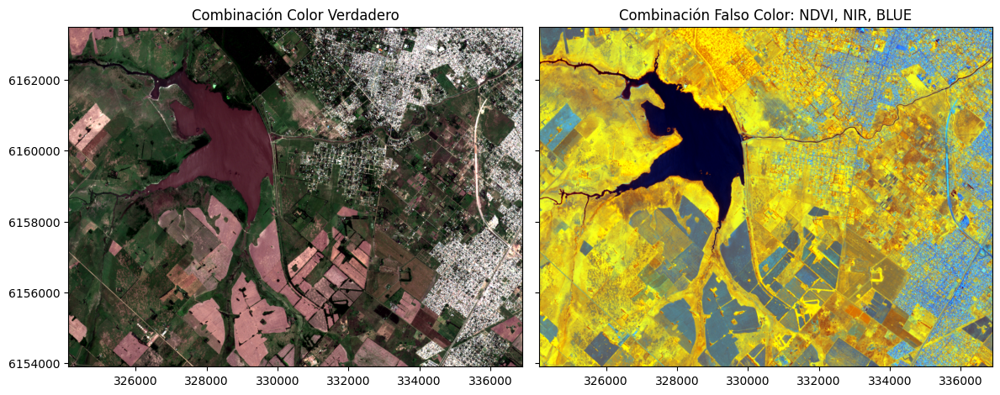

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(12, 10), sharey=True)

show(func.nequalize(S2_dique_20181006[[2, 1, 0]]), transform=gt, ax=ax[0])
show(func.nequalize(S2_dique_20181006[[4, 3, 0]]), transform=gt, ax=ax[1])

ax[0].set_title('Combinación Color Verdadero')
ax[1].set_title('Combinación Falso Color: NDVI, NIR, BLUE')
ax[0].ticklabel_format(style='plain')
ax[1].ticklabel_format(style='plain')
plt.tight_layout()
plt.show()

Lo anterior funciona, sin embargo, no siempre queremos descomprimir nuestras imágenes y ocupar espacio extra en nuestro disco. Para esto, una alternativa es leer directamente las imágenes desde el archivo ".zip", para esto utilizaremos la librería "zipfile" que nos permite cargar un archivo en memoria mientras leemos su contenido. Para entender un poco esto, vamos a cargar nuestro archivo comprimido y ejecutemos un par de instrucciones: 

```python
from zipfile import ZipFile  # Importamos el módulo ZipFile

data_dir = '../data/raw_data/'
fn_zip = 'L1C_T21HUB_A017181_20181006T135109.zip'
zipfilename = data_dir + fn_zip

# El siguiente bloque realiza un listado recursivo
# de los archivos contenidos en nuestro .zip
with ZipFile(zipfilename,'r') as zfile:
    lista = zfile.namelist()

lista
```

In [18]:
from zipfile import ZipFile  # Importamos el módulo ZipFile

data_dir = './raw_data/'
fn_zip = 'L1C_T21HUB_A023044_20191120T135113.zip'
zipfilename = data_dir + fn_zip

# El siguiente bloque realiza un listado recursivo
# de los archivos contenidos en nuestro .zip
with ZipFile(zipfilename,'r') as zfile:
    lista = zfile.namelist()

lista

['S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/INSPIRE.xml',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/rep_info/',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/rep_info/S2_User_Product_Level-1C_Metadata.xsd',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/star_bg.jpg',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/banner_1.png',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/banner_2.png',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/UserProduct_index.html',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/UserProduct_index.xsl',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/HTML/banner_3.png',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/AUX_DATA/',
 'S2A_MSIL1C_201911

Si queremos filtrar por ejemplo las bandas anteriores:

```python
# Alternativa 1:
bandas = ['B02', 'B03', 'B04', 'B08']
lista = []

with ZipFile(zipfilename,'r') as zfile:
    for b in bandas:
        lista.append([i for i in zfile.namelist() if i.endswith(f'{b}.jp2')])

lista.sort()
lista

# Alternativa 2. Para quienes están familiarizados con expresiones regulares:
import re

tileREXP = re.compile(r'.*_B(02|03|04|08).jp2$')

with ZipFile(zipfilename,'r') as zfile:
    lista = [x for x in zfile.namelist() if re.match(tileREXP, x)]

lista.sort()
lista
```

In [19]:
bandas = ['B02', 'B03', 'B04', 'B08']
lista = []

with ZipFile(zipfilename,'r') as zfile:
    for b in bandas:
        lista.append([i for i in zfile.namelist() if i.endswith(f'{b}.jp2')])

lista.sort()
lista

# Alternativa 2. Para quienes están familiarizados con expresiones regulares:
import re

tileREXP = re.compile(r'.*_B(02|03|04|08).jp2$')

with ZipFile(zipfilename,'r') as zfile:
    lista = [x for x in zfile.namelist() if re.match(tileREXP, x)]

lista.sort()
lista

['S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B02.jp2',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B03.jp2',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B04.jp2',
 'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B08.jp2']

Si imprimimos en pantalla nuestra primera imagen, veremos que contiene las rutas tomando como directorio raíz la carpeta ".SAFE" que se encuentra adentro de nuestro archivo "zip":

```python
lista[0]
```

In [20]:
lista[0]

'S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B02.jp2'

Esto no lo entiende la librería "rasterio" al momento de abrir nuestra imagen, por lo que hacerlo conlleva a un error:

```python
data_dir = '../data/raw_data/'
fn_zip = 'L1C_T21HUB_A017181_20181006T135109.zip'
zipfilename = data_dir + fn_zip

with rasterio.open(f'{zipfilename}/{lista[0]}') as src:
    print(src)

```

In [21]:
data_dir = './raw_data/'
fn_zip = 'L1C_T21HUB_A023044_20191120T135113.zip'
zipfilename = data_dir + fn_zip

with rasterio.open(f'{zipfilename}/{lista[0]}') as src:
    print(src)

RasterioIOError: ./raw_data/L1C_T21HUB_A023044_20191120T135113.zip/S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B02.jp2: No such file or directory

Para una correcta interpretación de nuestro archivo, debemos anteponer "/vsizip/" a nuestra ruta:

```python
data_dir = '../data/raw_data/'
fn_zip = 'L1C_T21HUB_A017181_20181006T135109.zip'
zipfilename = data_dir + fn_zip

with rasterio.open(f'/vsizip/{zipfilename}/{lista[0]}') as src:
    print(src)

```

In [23]:
data_dir = './raw_data/'
fn_zip = 'L1C_T21HUB_A023044_20191120T135113.zip'
zipfilename = data_dir + fn_zip

with rasterio.open(f'/vsizip/{zipfilename}/{lista[0]}') as src:
    print(src)

<open DatasetReader name='/vsizip/./raw_data/L1C_T21HUB_A023044_20191120T135113.zip/S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/T21HUB_20191120T135111_B02.jp2' mode='r'>


Podríamos entonces modificar nuestra función de lectura para leer directamente los datos desde nuestro archivo comprimido. Una alternativa sería:

```python
from zipfile import ZipFile
import re
import os

# Procesar Sentinel2
def extract_10m_bands_Sentinel2_ZIP(zipfilename, mbb=None, compute_ndvi=True, verbose=True):
    """
    Dado un archivo zip con las bandas de una imagen Sentinel 2, extrae las 4 bandas de 10m 
    de resolución (2, 3, 4 y 8) y calcula el NDVI. Si se pasa un polígono mbb en formato GeoJSON,
    recorta la imagen según dicho polígono, de lo contrario extrae la imagen completa.
    
    Parámetros:
        zipfilename: Ruta al archivo zip que contiene las bandas de la imagen Sentinel 2.
        mbb: Polígono en formato GeoJSON para recortar la imagen (opcional).
        compute_ndvi: Booleano para calcular el NDVI (opcional, por defecto True).
        verbose: Booleano para imprimir información adicional (opcional, por defecto True).
    
    Devuelve:
        np.ndarray: Matriz con las bandas extraídas (incluyendo NDVI si se calcula).
        crs: Sistema de referencia de coordenadas de la imagen.
        out_transform: Transformación geoespacial de la imagen.
    """
        
    # vsizip bugfix
    os.environ['CPL_ZIP_ENCODING'] = 'UTF-8'

    band_names = ['B02', 'B03', 'B04', 'B08']
    
    if verbose: print(f'Leyendo ZIP {zipfilename}')

    bands = []
    crs = None
    out_transform = None
    idx = {}
    
    with ZipFile(zipfilename,'r') as zfile:
        for pos, b in enumerate(band_names):
            fn = [i for i in zfile.namelist() if i.endswith(f'{b}.jp2')]
            
            # Nos aseguramos que el archivo exista, de lo contrario generamos un error
            # de tipo FileNotFoundError
            if not fn:
                raise FileNotFoundError(f"Banda {b} no encontrada en {os.path.basename(zipfilename)}.")

            idx[b.rstrip('.')] = pos 
            
            fn = f'/vsizip/{os.path.join(zipfilename, fn[0])}'
            if verbose: print(f'Leyendo {os.path.basename(fn)}')
    
            with rasterio.open(fn) as src:
                subband_crs = src.crs  # recuerdo el sistema de referencia para poder grabar
    
                if mbb:  # si hay mbb hago un clip
                    array, subband_transform = mask(src, [mbb], crop=True)
                else:  # si no, uso la imagen entera
                    array = src.read()
                    subband_transform = src.transform
    

            # Asegurarse de que crs y transform estén definidos (deben ser los mismos para todas las bandas)
            # En caso que estemos leyendo bandas con diferente resolución o crs, esto deberá generar un error
            # de tipo Value Error
        
            if crs is None:
                crs, out_transform = subband_crs, subband_transform
            elif crs != subband_crs or not np.array_equal(out_transform, subband_transform):
                raise ValueError(f"La banda {b} tiene diferente CRS o transformaciones.")
        
            # Normalizar la banda
            bands.append(np.float32(array[0]) / 10000)
    
    if compute_ndvi:
        if verbose: print(f"Calculando NDVI.")
        ndvi = (bands[idx['B08']] - bands[idx['B04']]) / (bands[idx['B08']] + bands[idx['B04']])
        bands.append(ndvi)
        
    return np.stack(bands), crs, out_transform
```

In [ ]:
# Se la declaro en funciones

Probemos nuestra función realizando la extracción y generando nuevamente nuestro stack:

```python
data_dir = '../data/raw_data/'
fn_zip = 'L1C_T21HUB_A017181_20181006T135109.zip'
S2_dique_20181006, crs, gt = extract_10m_bands_Sentinel2_ZIP(data_dir + fn_zip, mbb=mbb_dique)

plt.figure(figsize=(15, 15))
show(nequalize(S2_dique_20181006[[2, 1, 0]]))
plt.show()

plt.figure(figsize=(15, 15))
show(nequalize(S2_dique_20181006[[4, 3, 0]]))
plt.show()
```

Leyendo ZIP ./raw_data/L1C_T21HUB_A023044_20191120T135113.zip
Leyendo T21HUB_20191120T135111_B02.jp2
Leyendo T21HUB_20191120T135111_B03.jp2
Leyendo T21HUB_20191120T135111_B04.jp2
Leyendo T21HUB_20191120T135111_B08.jp2
Calculando NDVI.


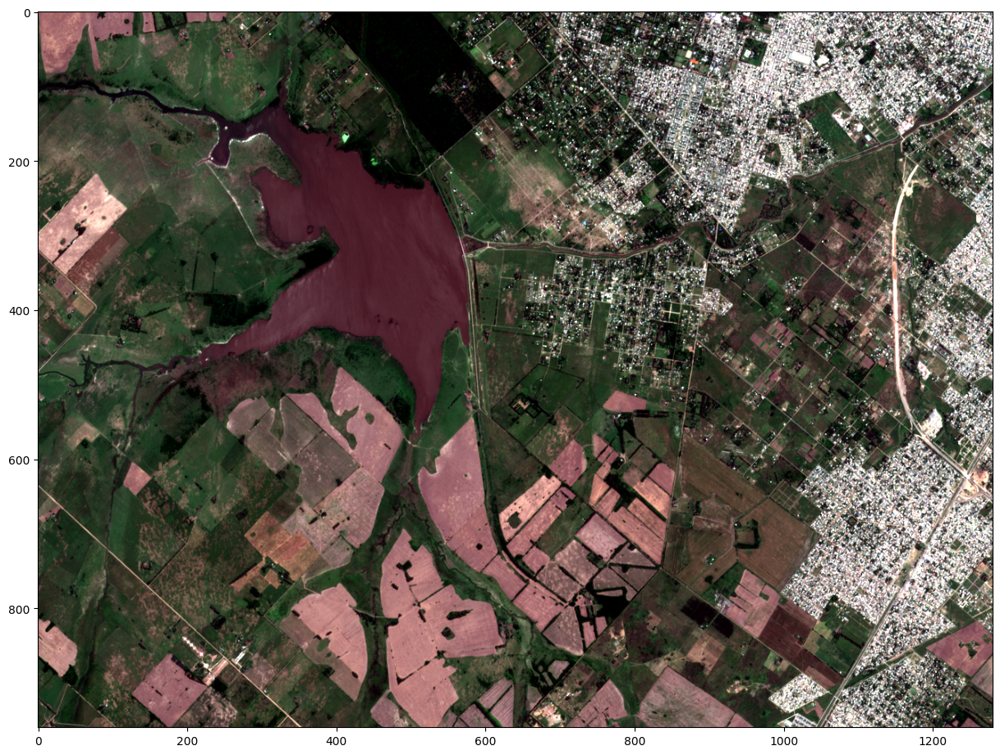

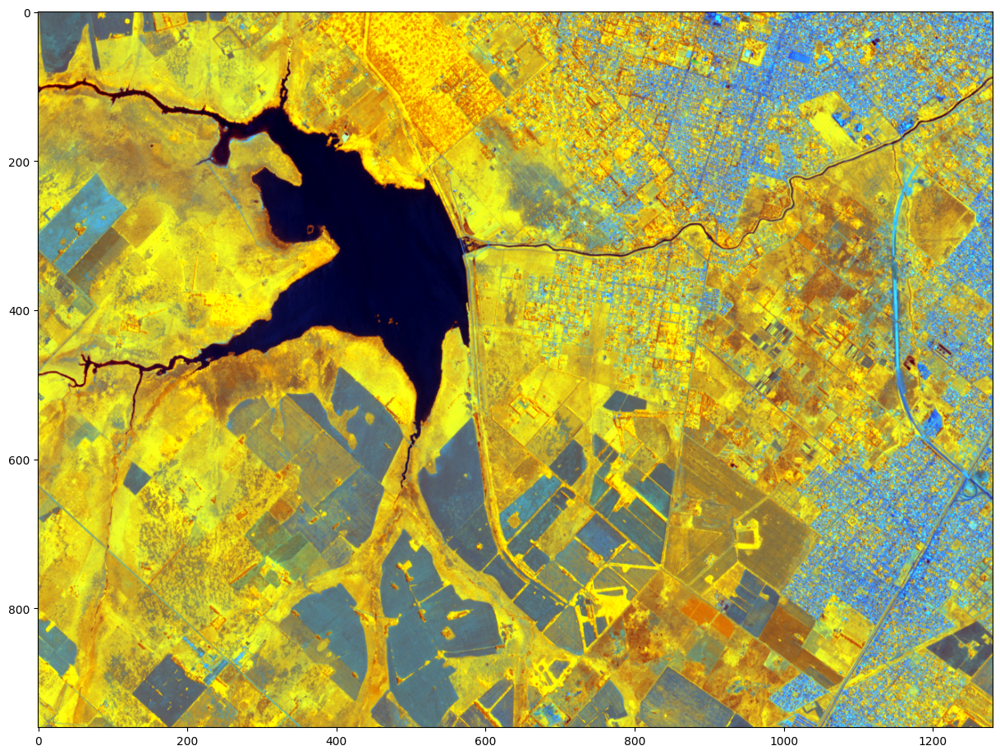

In [25]:
data_dir = './raw_data/'
fn_zip = 'L1C_T21HUB_A023044_20191120T135113.zip'
S2_dique_20181006, crs, gt = func.extract_10m_bands_Sentinel2_ZIP(data_dir + fn_zip, mbb=mbb_dique)

plt.figure(figsize=(15, 15))
show(func.nequalize(S2_dique_20181006[[2, 1, 0]]))
plt.show()

plt.figure(figsize=(15, 15))
show(func.nequalize(S2_dique_20181006[[4, 3, 0]]))
plt.show()

Guardamos nuestro resultado:

```python
bandnames_B_G_R_NIR_NDVI = ['Blue', 'Green', 'Red', 'NIR', 'NDVI']

guardar_GTiff(path_proc+'S2_dique_20181006.tif',
              crs,
              gt,
              S2_dique_20181006,
              bandnames=bandnames_B_G_R_NIR_NDVI)
```

In [26]:
bandnames_B_G_R_NIR_NDVI = ['Blue', 'Green', 'Red', 'NIR', 'NDVI']

func.guardar_GTiff_vF(path_proc+'S2_dique_20181006.tif',
              crs,
              gt,
              S2_dique_20181006,
              bandnames=bandnames_B_G_R_NIR_NDVI)

### Ejercicio 7.1 
    1. Leer la otra imagen Sentinel-2 del mismo directorio (la de fecha 2019-11-20) y guardar el mismo recorte `mbb_dique`. Mirar ambas imágenes en QGIS usando la combinación Red, NIR, Blue.

In [28]:
# La que se usó en esta notebook es el 2019-11-20, la otra no poseo en la presente descarfga

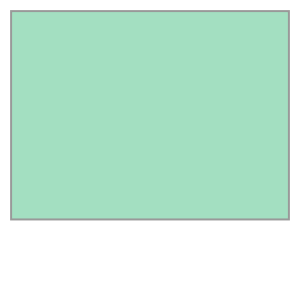

In [29]:
path_vector = './raw_data/vector/'

mbb_dique = compute_mbb(os.path.join(path_vector, 'zona_dique.geojson'), grid_step=100)

mbb_dique

In [30]:
path_in_img1 = './raw_data/L1C_T21HUB_A023044_20191120T135113/S2A_MSIL1C_20191120T135111_N0208_R024_T21HUB_20191120T152911.SAFE/GRANULE/L1C_T21HUB_A023044_20191120T135113/IMG_DATA/'
path_proc = './proc/'
path_out = './out/'

In [31]:
# Leyendo B02
fn = 'T21HUB_20191120T135111_B02.jp2'

with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)
    crs = src.crs

# Aplicamos el factor de escala:
B_blue = np.float32(banda[0]) / 10000.

# Leyendo B03
fn = 'T21HUB_20191120T135111_B03.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_green = np.float32(banda[0]) / 10000.

# Leyendo B04
fn = 'T21HUB_20191120T135111_B04.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_red = np.float32(banda[0]) / 10000.

# Leyendo B08
fn = 'T21HUB_20191120T135111_B08.jp2'
with rasterio.open(os.path.join(path_in_img1, fn)) as src:
    banda, out_transform = mask(src, [mbb_dique], crop=True)

# Aplicamos el factor de escala:
B_nir = np.float32(banda[0]) / 10000.

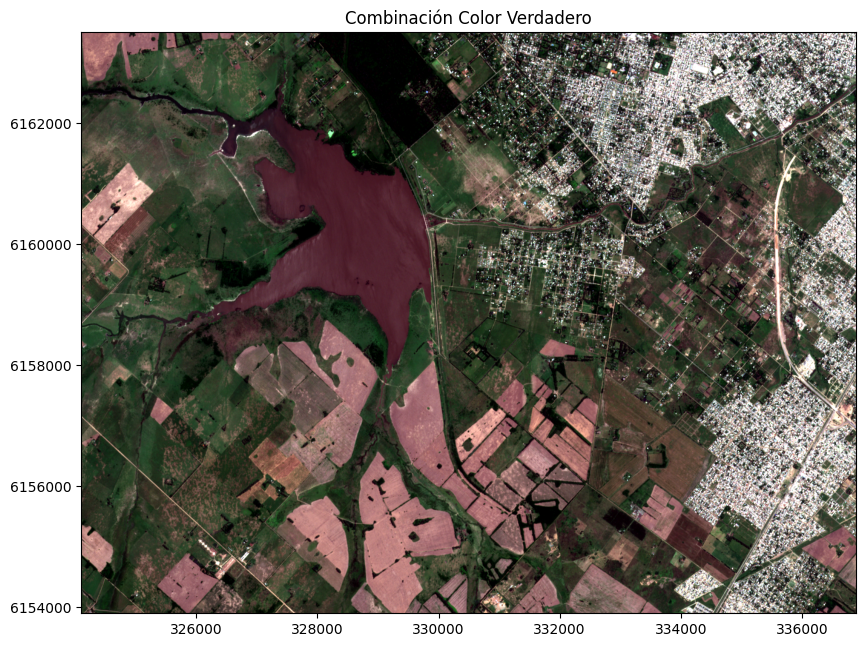

In [32]:
fig, ax = plt.subplots(figsize=(10, 10))

show(func.nequalize(np.stack([B_red, B_green, B_blue])),
     transform=out_transform, ax=ax)

ax.set_title('Combinación Color Verdadero')
ax.ticklabel_format(style='plain')

plt.show()

In [33]:
B_ndvi = (B_nir - B_red) / (B_nir + B_red)

In [34]:
# Definimos los parámetros de salida:
bandnames_B_G_R_NIR_NDVI =['Blue', 'Green', 'Red', 'NIR', 'NDVI']
output_name = path_out + 'Dique_B_G_R_NIR_NDVI.tif'
stack = np.stack([B_blue, B_green, B_red, B_nir, B_ndvi])

# Ejecutamos la función:
func.guardar_GTiff_vF(output_name,
              crs,
              out_transform,
              stack,
              bandnames=bandnames_B_G_R_NIR_NDVI)

Leyendo ZIP ./raw_data/L1C_T21HUB_A023044_20191120T135113.zip
Leyendo T21HUB_20191120T135111_B02.jp2
Leyendo T21HUB_20191120T135111_B03.jp2
Leyendo T21HUB_20191120T135111_B04.jp2
Leyendo T21HUB_20191120T135111_B08.jp2
Calculando NDVI.


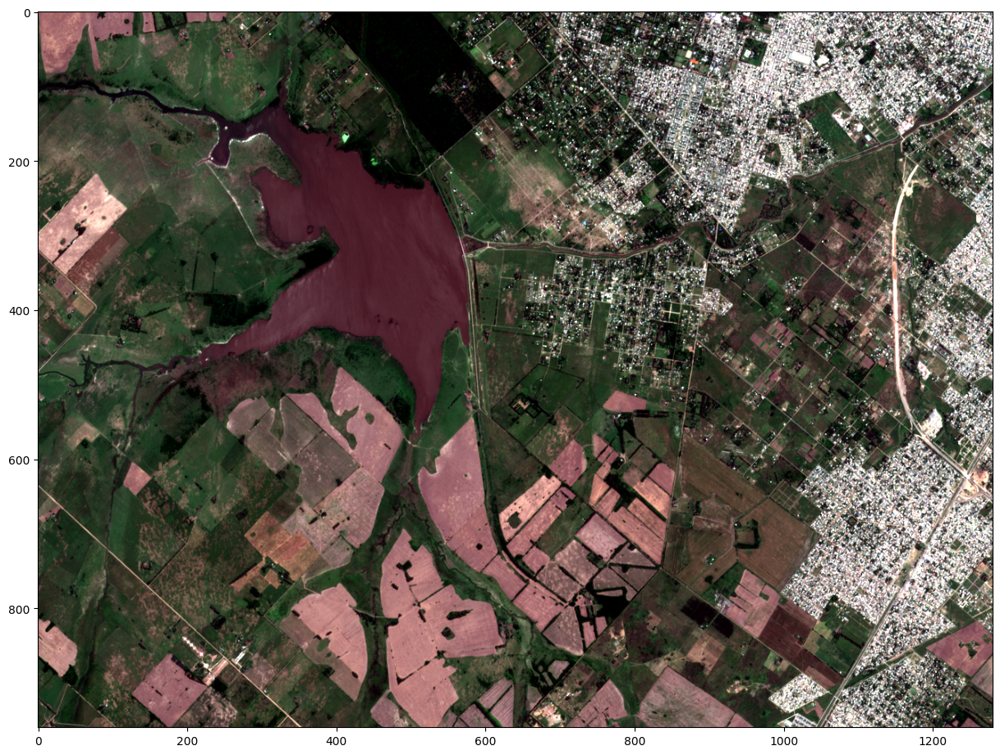

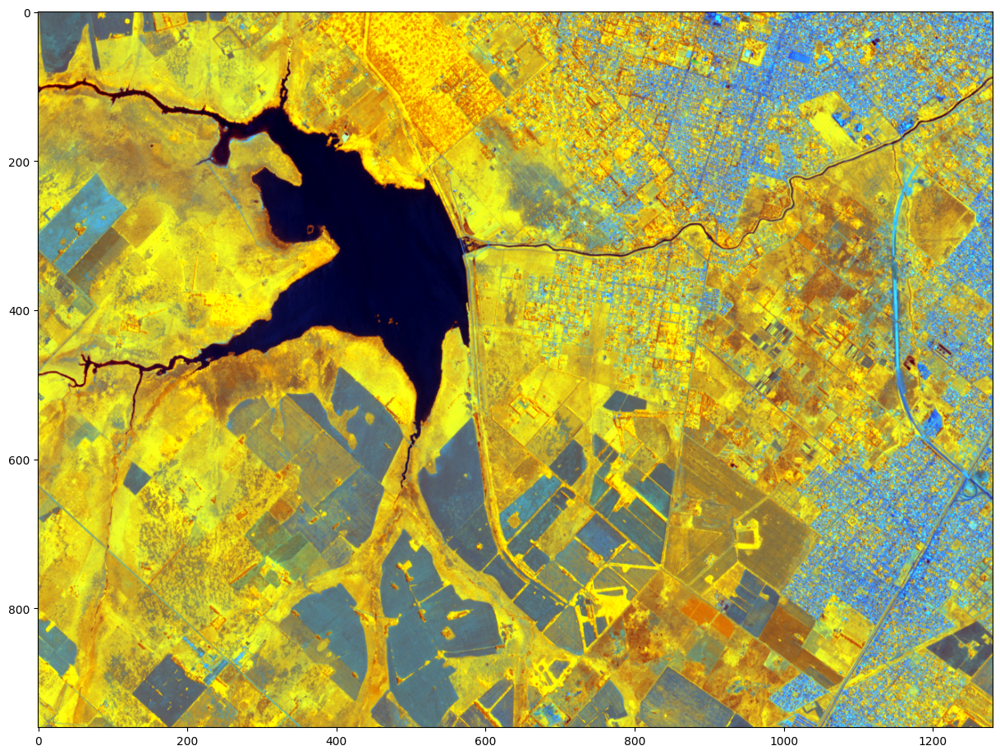

In [35]:
data_dir = './raw_data/'
fn_zip = 'L1C_T21HUB_A023044_20191120T135113.zip'
S2_dique_20191120, crs, gt = func.extract_10m_bands_Sentinel2_ZIP(data_dir + fn_zip, mbb=mbb_dique)

plt.figure(figsize=(15, 15))
show(func.nequalize(S2_dique_20191120[[2, 1, 0]]))
plt.show()

plt.figure(figsize=(15, 15))
show(func.nequalize(S2_dique_20191120[[4, 3, 0]]))
plt.show()